In [2]:
# !pip3 install numpy pandas matplotlib sklearn backtesting
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

In [29]:
# import sys
# sys.path.append(r"path to append backtesting library")

In [3]:
d_df  = pd.read_csv('../datasets/direction.csv')
d_df['timestamp'] = pd.to_datetime(d_df['timestamp'], format='%Y-%m-%d %H:%M:%S').astype(int)
d_df['vxbt_direction_next'] = d_df['vxbt_direction'].shift(1)
d_df = d_df.dropna().iloc[::-1].reset_index(drop = True)
d_df

,timestamp,vxbt_direction,tweet_vol_direction,sentiment_direction,gtrend_direction,index_direction,vxbt_direction_next
0,1556668800000000000,0,0,0,0,0,1.0
1,1556669100000000000,1,-1,-1,-1,-1,1.0
2,1556669400000000000,1,-1,1,-1,1,-1.0
3,1556669700000000000,-1,-1,1,-1,1,1.0
4,1556670000000000000,1,-1,0,-1,1,1.0
...,...,...,...,...,...,...,...
86366,1582587300000000000,-1,0,1,1,0,1.0
86367,1582587600000000000,1,-1,1,1,-1,-1.0
86368,1582587900000000000,-1,-1,1,1,1,-1.0
86369,1582588200000000000,-1,-1,1,1,1,1.0


In [4]:
from sklearn.ensemble import GradientBoostingClassifier


rolling_window = 14 * 24 * 12
two_hour_window = 24

# timestamp = []
# prediction = []
# x_train = []
# y_train = []

# def get_two_hour_window_estimators(df, j , samples_in_window = two_hour_window):
#     return df[['vxbt_direction','tweet_vol_direction','sentiment_direction','gtrend_direction','index_direction']].iloc[j - samples_in_window:j].to_numpy().ravel()

# for i in range(two_hour_window, rolling_window + two_hour_window):
#     x_train.append(get_two_hour_window_estimators(d_df, i))
#     # No need to add the +1, but I did to make sure the classes followed from [-1,0,1] to [0,1,2]
#     y_train.append(int(d_df['vxbt_direction_next'][i])+1)

# for j in range(rolling_window + two_hour_window, d_df.shape[0]):
#     # Using the parameters that were determined the best in time_series_anaylsis.ipynb
#     model = GradientBoostingClassifier(learning_rate=0.01, n_estimators=500, max_depth=4, min_samples_split=2,
#                                     min_samples_leaf=1, subsample=1,max_features='sqrt', random_state=10)
#     model.fit(np.asarray(x_train), np.asarray(y_train))
    
#     test = get_two_hour_window_estimators(d_df, j)
#     probs = model.predict_proba([test]).tolist()[0]
#     prediction.append(probs)
#     timestamp.append(d_df['timestamp'][j])
    
#     x_train.pop(0)
#     y_train.pop(0)
            
#     x_train.append(test)
#     y_train.append(int(d_df['vxbt_direction_next'][j])+1)
    
    
# probability_df = {'timestamp':timestamp, 'probabilities':prediction}
# probability_df = pd.DataFrame(probability_df)
# probability_df
    
    
# probability_df.to_csv('../datasets/probability_df2.csv')

In [ ]:
# This dataframe has a 2 week training period for 1 week of predictions

In [5]:
probability_df  = pd.read_csv('../datasets/probability_df2.csv').drop(['Unnamed: 0'], axis = 1)
probability_df

,timestamp,probabilities
0,1557885900000000000,"[0.25167901719349656, 0.3116396160518317, 0.43..."
1,1557886200000000000,"[0.40446419902355324, 0.18627927016570608, 0.4..."
2,1557886500000000000,"[0.3663418908896829, 0.2572915048698155, 0.376..."
3,1557886800000000000,"[0.2891729301636736, 0.25691940668383506, 0.45..."
4,1557887100000000000,"[0.3272334905251215, 0.21656791044488918, 0.45..."
...,...,...
82310,1582587300000000000,"[0.22579429572273108, 0.3192876915031056, 0.45..."
82311,1582587600000000000,"[0.28783616832052855, 0.26304556948330104, 0.4..."
82312,1582587900000000000,"[0.3272168871125178, 0.20661874441733982, 0.46..."
82313,1582588200000000000,"[0.28004619688157195, 0.2569373504321329, 0.46..."


In [21]:
xvxbt_dict = {}

with open('../datasets/vxbt_19-05_20-05.json', 'r') as f:
    vxbt_dict = json.loads(f.read())
    

vxbt_df = pd.DataFrame([{'datetime': k, 'vxbt': v[0]} for k, v in vxbt_dict.items()])
vxbt_df['datetime'] = pd.to_datetime(vxbt_df['datetime'], format='%Y-%m-%d %H:%M:%S').astype(int)
vxbt_df = vxbt_df.rename(columns={"datetime": "timestamp"})
vxbt_df = vxbt_df.sort_values(by='timestamp', ascending=True)

In [6]:
# btc_index_dbit_df = pd.read_csv('../datasets/deribit_btc_usd_index_19-05-01_20-05-31_5min.csv')
# btc_index_dbit_df['Date and Time'] = pd.to_datetime(btc_index_dbit_df['Date and Time'], format='%Y-%m-%d %H:%M:%S').astype(int)
# btc_index_dbit_df = btc_index_dbit_df.rename(columns={"Date and Time": "timestamp"})
# btc_index_dbit_df

,timestamp,Price
0,1556668800000000000,5269.46
1,1556669100000000000,5268.33
2,1556669400000000000,5272.10
3,1556669700000000000,5277.00
4,1556670000000000000,5289.70
...,...,...
114331,1590968100000000000,9433.96
114332,1590968400000000000,9410.57
114333,1590968700000000000,9418.37
114334,1590969000000000000,9443.99


In [25]:
bt_df = probability_df.merge(vxbt_df, left_on='timestamp', right_on = 'timestamp')
bt_df['timestamp'] = pd.to_datetime(bt_df['timestamp'], format='%Y-%m-%d %H:%M:%S')
bt_df = bt_df.rename(columns={"vxbt": "High"}).drop(['probabilities'], axis = 1)
bt_df['Low'] = bt_df['Open'] = bt_df['Close'] = bt_df['High']
bt_df = bt_df.set_index('timestamp')
bt_df = bt_df.fillna(method='ffill')

In [26]:
from backtesting import Backtest, Strategy

from sklearn.ensemble import GradientBoostingClassifier
from tqdm import tqdm

x = []
sharpe = []
sortino = []
calmar = []
return_percent = []

for j in tqdm(range(140)):
    
    class BitFear(Strategy):
        def init(self):
            Close = self.data.Close
            self.probs = probability_df
            self.t = round(0.3 + 0.005 * j,3)


        def next(self):
            i = len(self.data.Open)-1
            class_probabilities = self.probs['probabilities'][i]

            # When read from the csv, class probabilities become a string
            class_probabilities = class_probabilities.strip('][').split(', ')
            predicted_class = class_probabilities.index(max(class_probabilities))

            if predicted_class == 2 and float(class_probabilities[predicted_class]) > self.t:
                self.buy()
            elif predicted_class == 0 and float(class_probabilities[predicted_class]) > self.t:
                self.sell() 
            
            

    bt = Backtest(bt_df, BitFear, cash=10000, commission = 0)
    
    x += [round(0.3 + 0.005 * j,3)]
    result = bt.run()
    sharpe.append(result['Sharpe Ratio'])
    sortino.append(result['Sortino Ratio'])
    calmar.append(result['Calmar Ratio'])
    return_percent.append(result['Return [%]'])


100%|██████████| 140/140 [04:04<00:00,  1.75s/it]


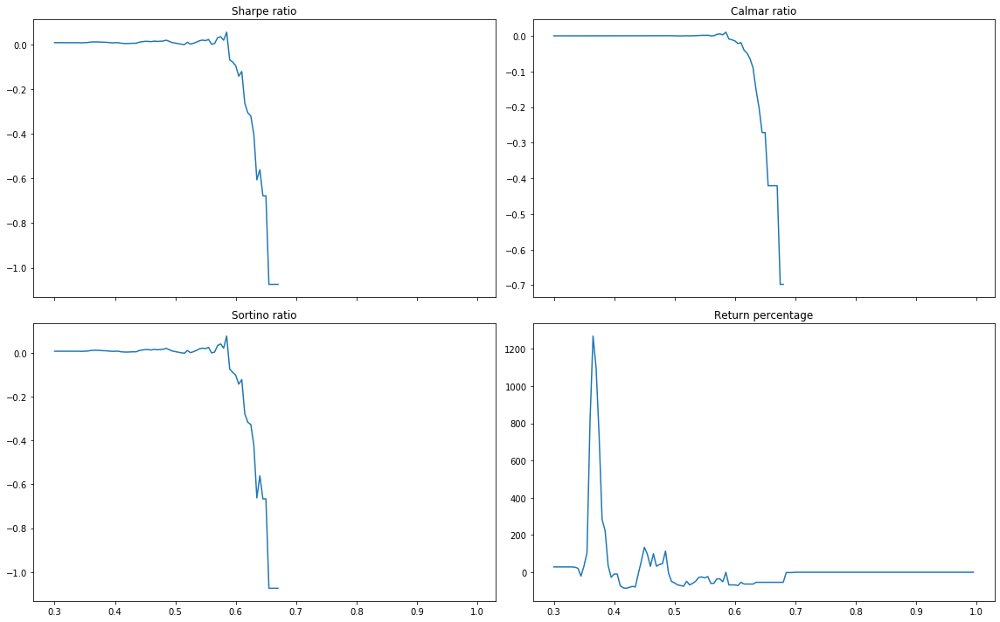

In [27]:
plt.rcParams["figure.figsize"] = (16, 10)

fig, axs = plt.subplots(2,2, sharex=True)

axs[0, 0].plot(x, sharpe)
axs[0, 0].set_title("Sharpe ratio")
axs[1, 0].plot(x, sortino)
axs[1, 0].set_title("Sortino ratio")
axs[0, 1].plot(x, calmar)
axs[0, 1].set_title("Calmar ratio")
axs[1, 1].plot(x, return_percent)
axs[1, 1].set_title("Return percentage")


fig.tight_layout()

In [47]:
print(0.05470664501293719 * np.sqrt(12))
print(x[np.argmax(return_percent)])
print(0.011108 * np.sqrt(12))

0.1895093773480835
0.365
0.038479240740950174


In [33]:
# t with the best return %

class BitFearBest(Strategy):
        def init(self):
            Close = self.data.Close
            self.probs = probability_df
            self.t = x[np.argmax(return_percent)]


        def next(self):
            i = len(self.data.Open)-1
            class_probabilities = self.probs['probabilities'][i]

            # When read from the csv, class probabilities become a string
            class_probabilities = class_probabilities.strip('][').split(', ')
            predicted_class = class_probabilities.index(max(class_probabilities))

            if predicted_class == 2 and float(class_probabilities[predicted_class]) > self.t:
                self.buy()
            elif predicted_class == 0 and float(class_probabilities[predicted_class]) > self.t:
                self.sell() 
            
            

bt1 = Backtest(bt_df, BitFearBest, cash=10000, commission = 0)
result = bt1.run()
result

Start                     2019-05-15 02:05:00
End                       2020-02-24 23:55:00
Duration                    285 days 21:50:00
Exposure [%]                          99.9976
Equity Final [$]                       136949
Equity Peak [$]                        207921
Return [%]                            1269.49
Buy & Hold Return [%]                 49.7685
Max. Drawdown [%]                    -84.4772
Avg. Drawdown [%]                    -6.48278
Max. Drawdown Duration       85 days 00:40:00
Avg. Drawdown Duration        1 days 17:44:00
# Trades                                44538
Win Rate [%]                          55.4807
Best Trade [%]                        49.2859
Worst Trade [%]                      -32.5697
Avg. Trade [%]                      0.0161338
Max. Trade Duration           1 days 12:05:00
Avg. Trade Duration           0 days 00:10:00
Expectancy [%]                       0.407121
SQN                                  0.895919
Sharpe Ratio                      

In [34]:
bt1.plot()